# Neighborhood Dynamics

The geosnap package is designed for geodemographic analysis and regionalization applied to longitudinal data. Following those analyses, it also provides tools for modeling neighborhood composition into the future using spatial and temporal transition rules learned from the past.

In [1]:
%load_ext watermark
%watermark -v -a "author: eli knaap" -d -u -p segregation,libpysal,geopandas,geosnap

Author: author: eli knaap

Last updated: 2024-01-16

Python implementation: CPython
Python version       : 3.11.0
IPython version      : 8.18.1

segregation: 2.5
libpysal   : 4.9.2
geopandas  : 0.14.1
geosnap    : 0.12.1.dev9+g3a1cb0f6de61.d20240110



In [2]:
from geosnap import DataStore
from geosnap.io import get_acs
from geosnap.analyze import cluster, regionalize, find_k

In [3]:
from geosnap.visualize import plot_timeseries, animate_timeseries

In [4]:
import geopandas as gpd

## Examining Data

In [5]:
store = DataStore()

The DataStore class provides access to hundreds of neighbrohood indicators for the U.S. collected from federal agencies. We store these datasets in the cloud and stream them on demand. But if you plan on doing repeated analyses you can store the data locally (which we've already done on the JupyterHub)

In [6]:
chicago = get_acs(store, county_fips='17031', level='tract', years=list(range(2013, 2017)))  # without specifying a subset of years, we get everything

/Users/knaaptime/Dropbox/projects/geosnap/geosnap/io/constructors.py:188: UserWarning: `constant_dollars` is True, but no `currency_year` was specified. Resorting to max value of 2016
  warn(


In [8]:
chicago.info()

<class 'geopandas.geodataframe.GeoDataFrame'>
RangeIndex: 5276 entries, 0 to 5275
Columns: 161 entries, geoid to p_vietnamese_persons
dtypes: float64(158), geometry(1), int64(1), object(1)
memory usage: 6.5+ MB


In [9]:
chicago.head()

,geoid,n_mexican_pop,n_cuban_pop,n_puerto_rican_pop,n_russian_pop,n_italian_pop,n_german_pop,n_irish_pop,n_scandaniavian_pop,n_foreign_born_pop,...,n_chinese_persons,n_filipino_persons,n_japanese_persons,n_korean_persons,n_vietnamese_persons,p_chinese_persons,p_filipino_persons,p_japanese_persons,p_korean_persons,p_vietnamese_persons
0,17031010100,235.0,0.0,84.0,0.0,31.0,78.0,21.0,0.0,996.0,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
1,17031010201,1745.0,0.0,38.0,60.0,81.0,31.0,63.0,0.0,2530.0,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
2,17031010202,480.0,16.0,6.0,8.0,34.0,104.0,55.0,0.0,676.0,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
3,17031010300,636.0,54.0,16.0,152.0,38.0,138.0,190.0,0.0,1951.0,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
4,17031010400,269.0,79.0,67.0,20.0,111.0,206.0,177.0,0.0,822.0,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN


There are also convenient plotting methods for looking at change over time. A useful feature here is that the choropleth bins are the same for each time period, making it easy to see change over time

/Users/knaaptime/Dropbox/projects/geosnap/geosnap/visualize/mapping.py:170: UserWarning: `proplot` is not installed.  Falling back to matplotlib
  warn("`proplot` is not installed.  Falling back to matplotlib")


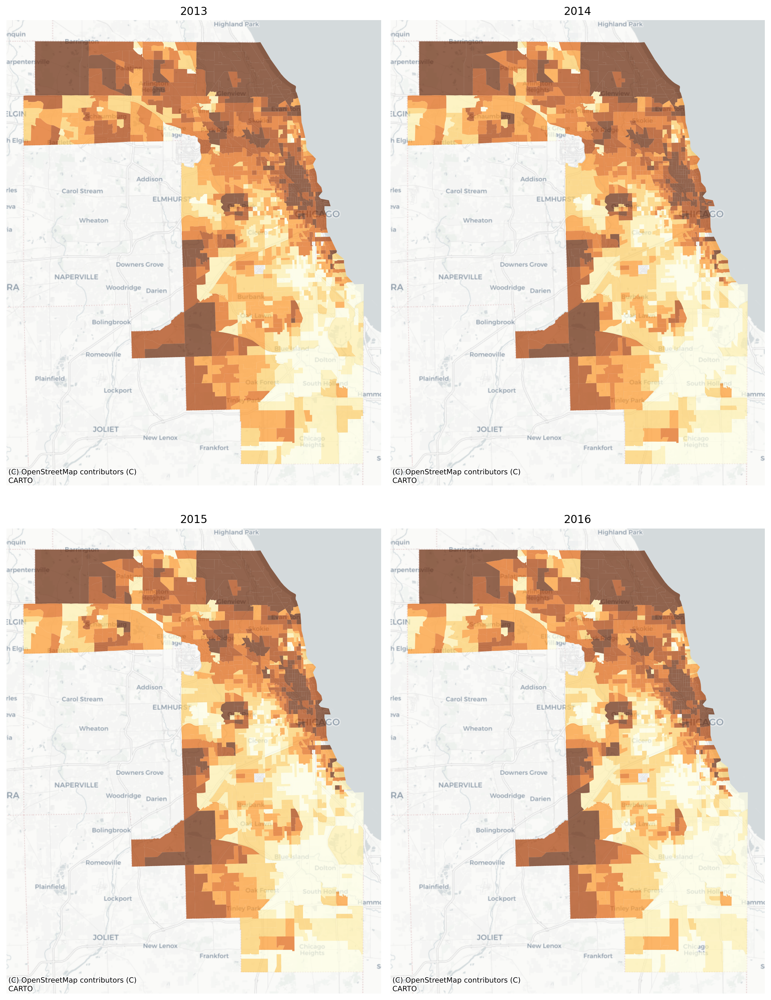

In [10]:
import matplotlib.pyplot as plt
plot_timeseries(chicago, "median_home_value", scheme='quantiles', k=7, nrows=2, ncols=2, cmap='YlOrBr', figsize=(12,16), legend=False)
plt.tight_layout()

Still it can be difficult to see minute changes across the various maps. The `animate_timeseries` function can make it easier to see what's happening, like the steady income decline in Midlothian near the southern edge of the region

In [11]:
animate_timeseries(chicago, 'median_home_value', scheme='quantiles', k=7, cmap='YlOrBr', filename='chicago_income_change.gif', fps=1.5)

<Figure size 2000x2000 with 0 Axes>

<Figure size 2000x2000 with 0 Axes>

<Figure size 2000x2000 with 0 Axes>

<Figure size 2000x2000 with 0 Axes>

<Figure size 1000x1000 with 0 Axes>

In [12]:
from IPython.display import Image

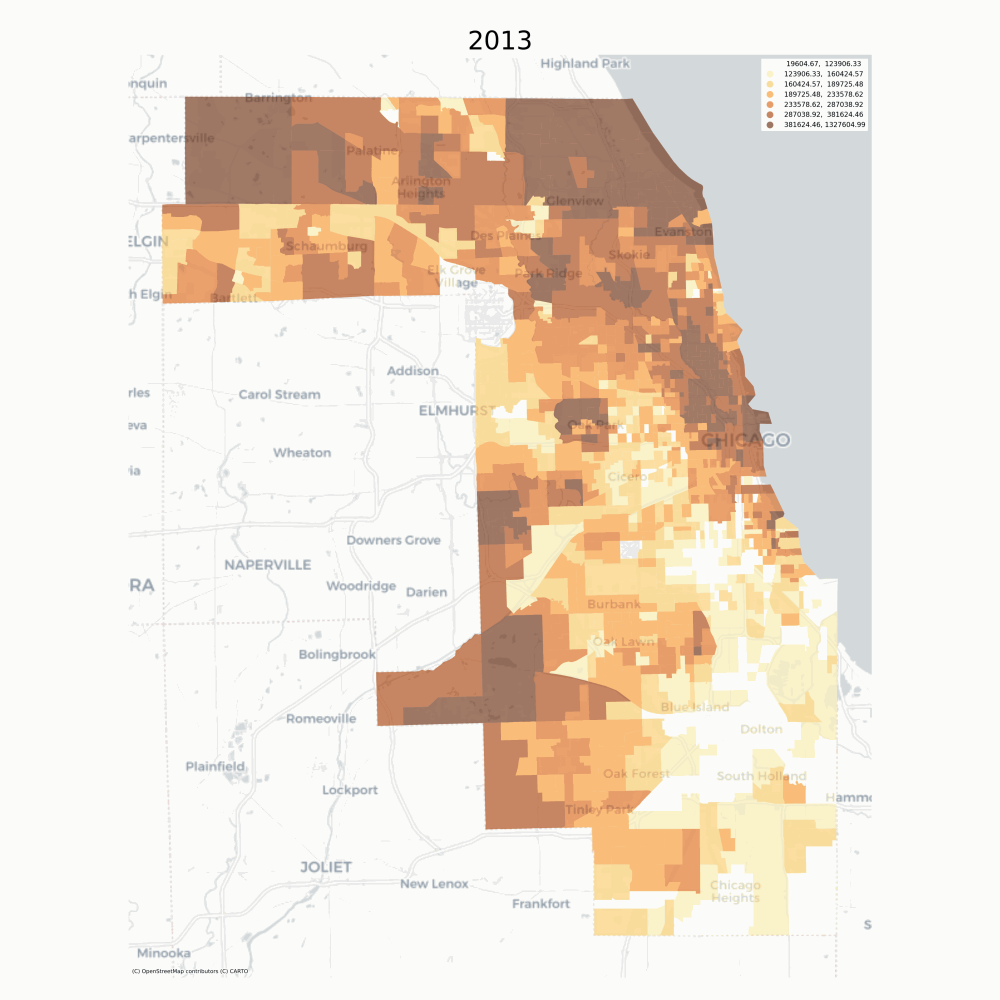

In [13]:
Image("chicago_income_change.gif", width=800)

Note here that we're comparing overlapping samples from the ACS 5-year survey, which the Census Bureau recommends against. Here it just makes a good example :)

## Modeling Neighborhood Types

With `geosnap`, it's possible to look at *temporal* geodemographics without writing much code. Under the hood, the package provides tools for scaling each dataset within its own time period, adjusting currency values for inflation, and ensuring that times, variables, and geometries stay aligned properly. Together those tools make it easy to explore how different portions of the region transition into different neighborhood types over time, and if desired, model the evolution of neighborhood change as a spatial Markov process.

Any variables could be used to examine neighborhood transitions, but we'll return to the simple set of sociodemographic veriables used before to understand if/how patterns of racial and socioeconomic segregation and neighborhood partitioning unfold over time

In [14]:
columns = ['median_household_income', 'median_home_value', 'p_asian_persons', 'p_hispanic_persons', 'p_nonhisp_black_persons', 'p_nonhisp_white_persons']

In [44]:
chicago_ward = cluster(gdf=chicago, columns=columns, method='ward', n_clusters=5)

The simplest version of the function returns the geodataframe with new cluster labels appended

In [45]:
chicago_ward.head()

,year,geoid,n_mexican_pop,n_cuban_pop,n_puerto_rican_pop,n_russian_pop,n_italian_pop,n_german_pop,n_irish_pop,n_scandaniavian_pop,...,n_filipino_persons,n_japanese_persons,n_korean_persons,n_vietnamese_persons,p_chinese_persons,p_filipino_persons,p_japanese_persons,p_korean_persons,p_vietnamese_persons,ward
0,2013,17031010100,235.0,0.0,84.0,0.0,31.0,78.0,21.0,0.0,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,2
1,2013,17031010201,1745.0,0.0,38.0,60.0,81.0,31.0,63.0,0.0,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,2
2,2013,17031010202,480.0,16.0,6.0,8.0,34.0,104.0,55.0,0.0,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,2
3,2013,17031010300,636.0,54.0,16.0,152.0,38.0,138.0,190.0,0.0,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,0
4,2013,17031010400,269.0,79.0,67.0,20.0,111.0,206.0,177.0,0.0,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,0


/Users/knaaptime/Dropbox/projects/geosnap/geosnap/visualize/mapping.py:170: UserWarning: `proplot` is not installed.  Falling back to matplotlib
  warn("`proplot` is not installed.  Falling back to matplotlib")


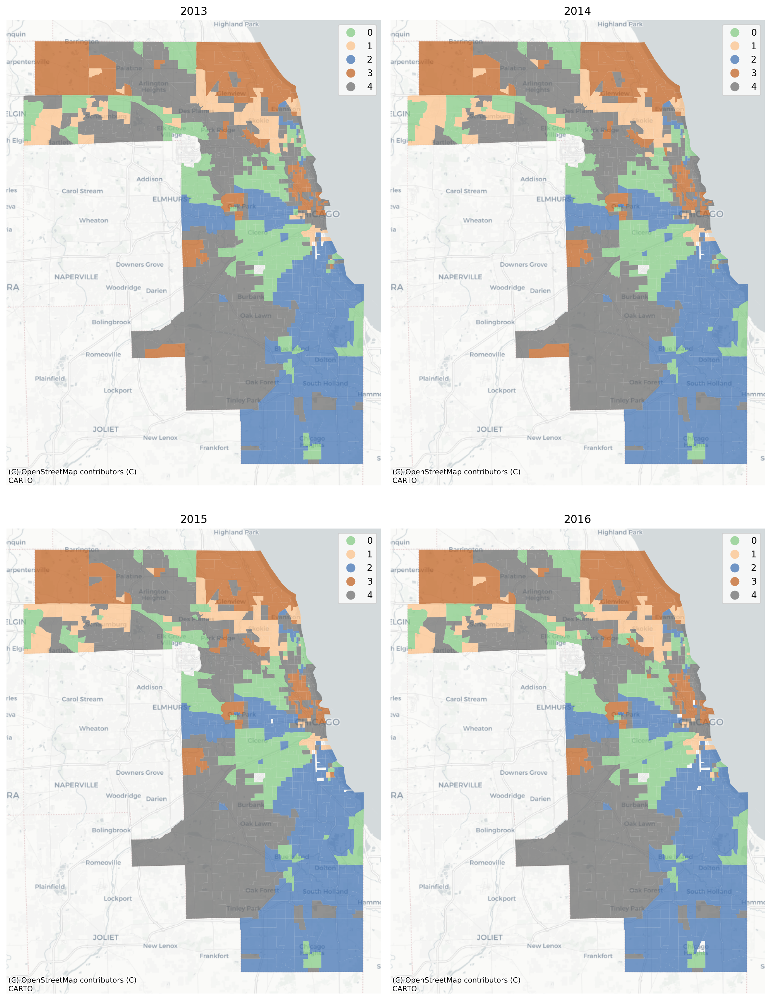

In [46]:
plot_timeseries(chicago_ward, 'ward', categorical=True, nrows=2, ncols=2, figsize=(12,16))
plt.tight_layout()

In [47]:
animate_timeseries(chicago_ward, 'ward', categorical=True, filename='chicago_type_change.gif', fps=1.5)

<Figure size 2000x2000 with 0 Axes>

<Figure size 2000x2000 with 0 Axes>

<Figure size 2000x2000 with 0 Axes>

<Figure size 2000x2000 with 0 Axes>

<Figure size 1000x1000 with 0 Axes>

The vast majority of tracts are assigned to the same geodemographic type in each time period, but some transition into different types over time. The ones that *do* transition tend to be those on the edges of large contiguous groups (i.e. change tends to happen along the periphery and move inward, implying a certain kind of spatial dynamic)

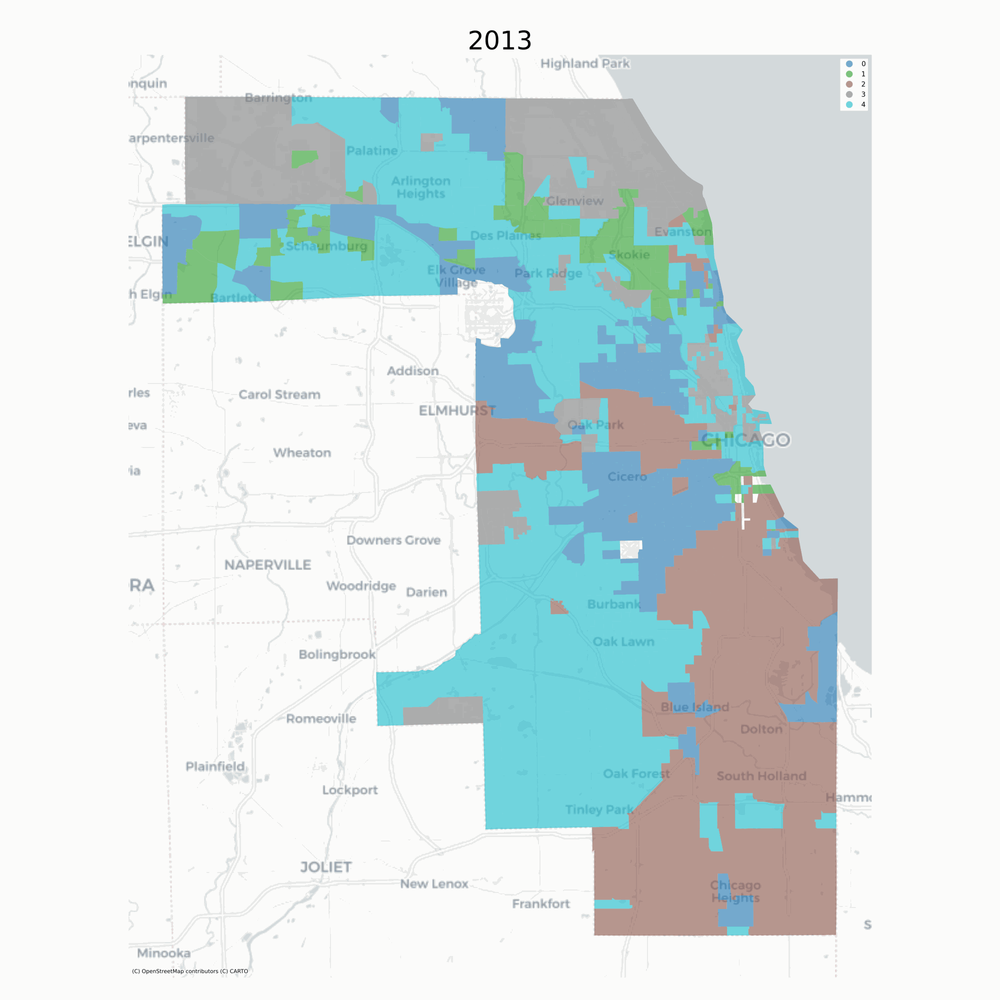

In [48]:
Image('chicago_type_change.gif', width=800)

If we add the argument `return_model=True`, then the function returns the same geodataframe as before, as well as a `ModelResults` class that holds additional diagnostic measures, as well as plotting and simulation methods

In [49]:
chicago_ward, chi_model = cluster(chicago, columns=columns, method='ward', n_clusters=6, return_model=True)

In [50]:
type(chi_model)

geosnap.analyze._model_results.ModelResults

For example, the `silhouette_scores` attribute makes computing a silhouette coefficient for the cluster model a one-liner:

In [51]:
chi_model.silhouette_scores

,silhouette_score,geoid,year,geometry
0,0.136093,17031010100,2013,"MULTIPOLYGON (((-87.67720 42.02294, -87.67628 ..."
1,0.099845,17031010201,2013,"MULTIPOLYGON (((-87.68465 42.01948, -87.68432 ..."
2,-0.178627,17031010202,2013,"MULTIPOLYGON (((-87.67683 42.01941, -87.67674 ..."
3,0.188316,17031010300,2013,"MULTIPOLYGON (((-87.67133 42.01937, -87.67121 ..."
4,-0.141755,17031010400,2013,"MULTIPOLYGON (((-87.66345 42.01283, -87.66321 ..."
...,...,...,...,...
5268,0.522373,17031843500,2016,"MULTIPOLYGON (((-87.70504 41.84452, -87.70479 ..."
5269,0.603410,17031843600,2016,"MULTIPOLYGON (((-87.61150 41.81128, -87.61125 ..."
5270,0.019169,17031843700,2016,"MULTIPOLYGON (((-87.69683 41.94967, -87.69681 ..."
5271,0.102991,17031843800,2016,"MULTIPOLYGON (((-87.64554 41.80886, -87.64542 ..."


Each observation is given its own silhouette score to identify potential spatial outliers, or the measures can be summarized to provide an aggregate statistic

In [52]:
chi_model.silhouette_scores.silhouette_score.mean()

0.35971262107670565

Since the data are indexed by time, we can also examine whether certain time periods have a poorer fit versus others:

In [53]:
chi_model.silhouette_scores.groupby('year').silhouette_score.mean()

year
2013    0.362116
2014    0.361529
2015    0.359077
2016    0.356111
Name: silhouette_score, dtype: float64

## Analyzing Neighborhood Change

With the cluster model in hand, each census tract is represented as a series of neighborhood types over time (i.e. what we plotted above). To understand which neighborhoods have experienced the most change, the `ModelResults` class implements a method called "LINCS", the Local Indicator of Neighborhood Change. The `lincs` attribute measures how often a given spatial unit shares its cluster assignment with the other units over time.

If a "neighborhood" is grouped with many different neighborhoods over time (rather than joining a single group with the same members repeatedly), then it shows more variation and thus a higher LINC score

In [54]:
chi_lincs = chi_model.lincs

In [55]:
chi_lincs

,geoid,geometry,2013,2014,2015,2016,linc
0,17031010100,"MULTIPOLYGON (((-87.67720 42.02294, -87.67628 ...",0.0,0.0,0.0,0.0,0.017857
1,17031010201,"MULTIPOLYGON (((-87.68465 42.01948, -87.68432 ...",0.0,0.0,0.0,0.0,0.017857
2,17031010202,"MULTIPOLYGON (((-87.67683 42.01941, -87.67674 ...",0.0,0.0,0.0,0.0,0.017857
3,17031010300,"MULTIPOLYGON (((-87.67133 42.01937, -87.67121 ...",2.0,2.0,2.0,2.0,0.303371
4,17031010400,"MULTIPOLYGON (((-87.66345 42.01283, -87.66321 ...",2.0,2.0,2.0,2.0,0.303371
...,...,...,...,...,...,...,...
1304,17031843500,"MULTIPOLYGON (((-87.70504 41.84452, -87.70479 ...",0.0,0.0,0.0,0.0,0.017857
1305,17031843600,"MULTIPOLYGON (((-87.61150 41.81128, -87.61125 ...",0.0,0.0,0.0,0.0,0.017857
1306,17031843700,"MULTIPOLYGON (((-87.69683 41.94967, -87.69681 ...",4.0,4.0,4.0,3.0,0.994307
1307,17031843800,"MULTIPOLYGON (((-87.64554 41.80886, -87.64542 ...",0.0,0.0,0.0,0.0,0.017857


<Axes: >

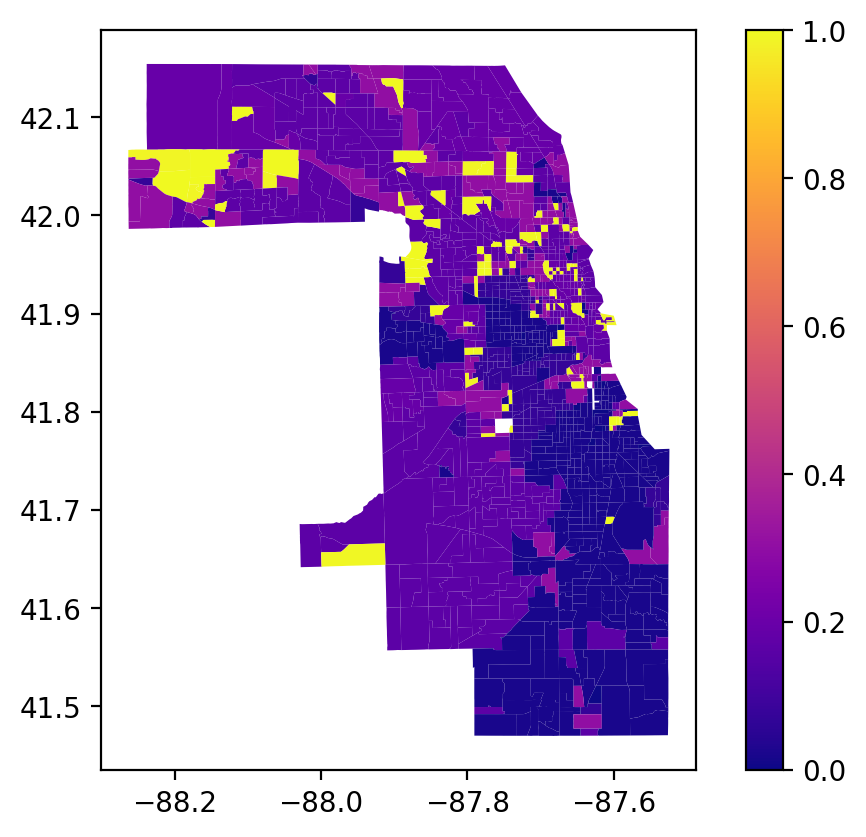

In [56]:
chi_lincs.plot('linc',legend=True, cmap='plasma')

Yellow places have changed the most in our cluster model, and blue places have remained the most stagnant. We can use the LISA statistics from `esda` to locate hotspots of change or stagnation

<Axes: ylabel='Density'>

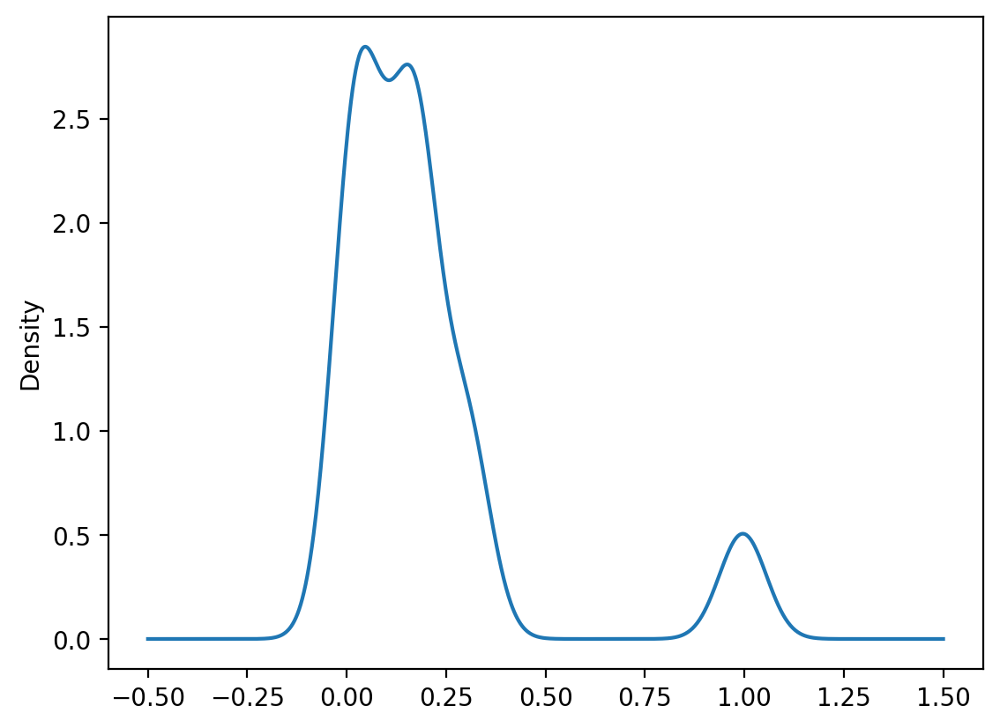

In [57]:
chi_lincs.linc.plot(kind='density')

In [58]:
from esda import Moran_Local

In [59]:
from libpysal.weights import Queen

In [60]:
w = Queen.from_dataframe(chi_model.lincs)

/var/folders/79/cknfb1sx2pv16rztkpg6wzlw0000gn/T/ipykernel_75148/3977480944.py:1: FutureWarning: `use_index` defaults to False but will default to True in future. Set True/False directly to control this behavior and silence this warning
  w = Queen.from_dataframe(chi_model.lincs)


In [61]:
linc_lisa = Moran_Local(chi_lincs.linc, w)

Recall that the LISA statistic measures the association between a focal observation and its neighbors. When we have spatial units (i.e. tracts) with a high LINC score, and their neighboring tracts *also* have high LINC scores, then we've found a local pocket of neighborhood change.

In [62]:
linc_lisa.Is

array([ 0.19094133, -0.38635302, -0.13315014, ...,  2.09900215,
        0.3517673 ,  0.49985707])

<Axes: >

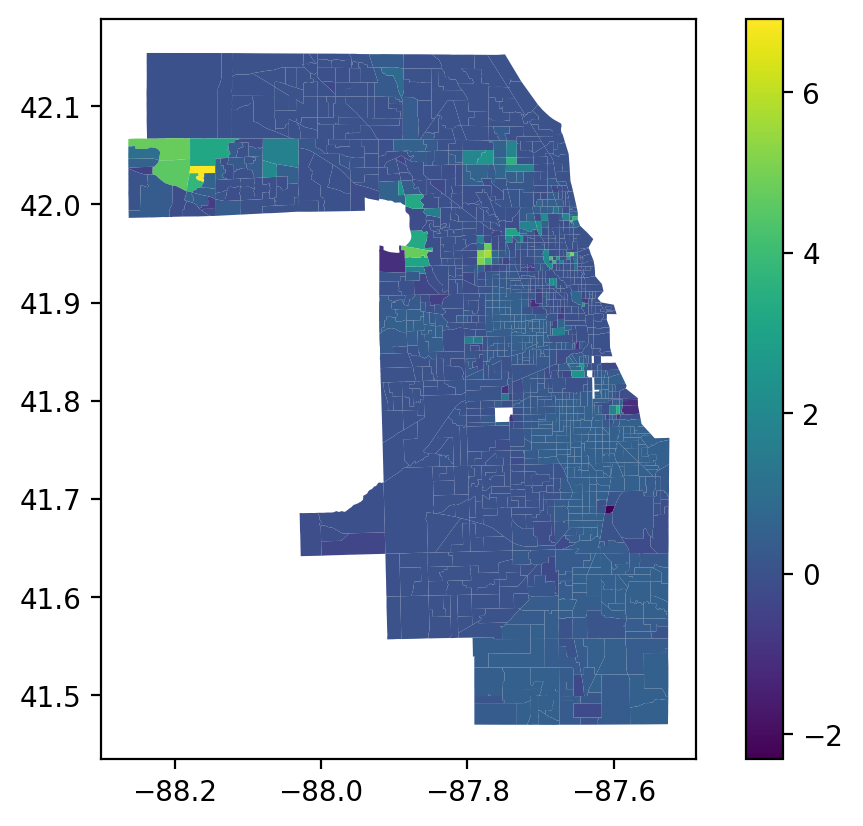

In [63]:
chi_lincs.assign(i=linc_lisa.Is).plot('i', legend=True)

In [64]:
from splot.esda import plot_local_autocorrelation, lisa_cluster

(<Figure size 1500x400 with 3 Axes>,
 array([<Axes: title={'center': 'Moran Local Scatterplot'}, xlabel='Attribute', ylabel='Spatial Lag'>,
        <Axes: >, <Axes: >], dtype=object))

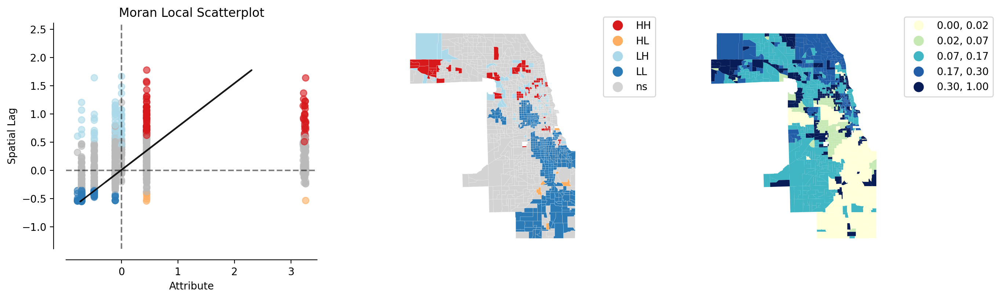

In [65]:
plot_local_autocorrelation(linc_lisa, chi_lincs.to_crs(3857), 'linc')

In [66]:
import contextily as ctx

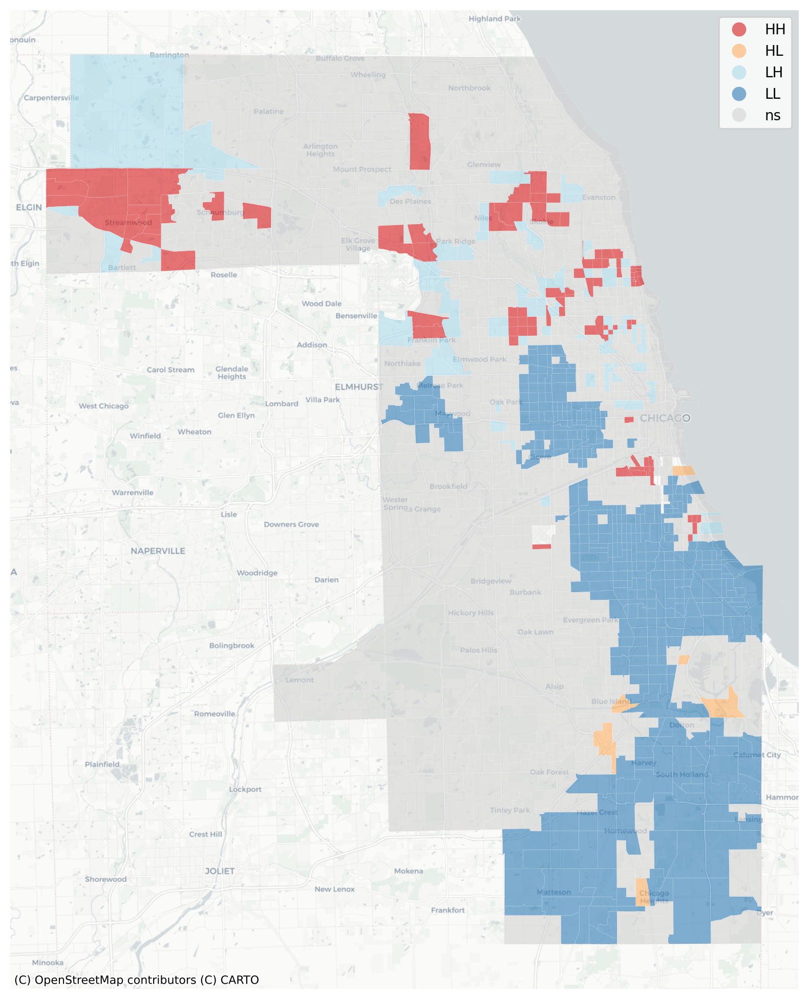

In [67]:
fig, ax = lisa_cluster(linc_lisa, chi_lincs.to_crs(3857), alpha=0.6, figsize=(8,10))
ctx.add_basemap(ax=ax, source=ctx.providers.CartoDB.Positron, zoom=11)
fig.tight_layout()

Red areas of high-high clusters of LINC scores are places undergoing change, whereas blue places (low LINC scores surrounded by low scores) are those that have changed very little over time. Orange places are particularly interesting, as they represent local pockets of change surrounded by larger pockets of stagnation.

Substantively, this example shows that Chicago's famously segregated South Side and West Side form large regions of the city that demonstrate little demographic/socioeconomic change, particularly in neighborhoods like Rosewood and West Garfield. By contrast, places like Brideport and Portage Park have witnessed substantial change over the last decade according to this model

## Modeling Neighborhood Transitions

We can also use the sequence of labels to create a spatial Markov transition model. These models examine how often one neighborhood type transitions into another type--then how these transition rates change under different conditions of spatial context

In [68]:
from geosnap.visualize import plot_transition_matrix

/Users/knaaptime/Dropbox/projects/geosnap/geosnap/visualize/transitions.py:82: UserWarning: Creating a transition model implicitly is deprecated and will be removed in future versions. please pass a giddy.Spatial_Markov instance using `giddy` or `geosnap.analyze.transition`
  warn(
/Users/knaaptime/Dropbox/projects/geosnap/geosnap/analyze/dynamics.py:123: FutureWarning: `use_index` defaults to False but will default to True in future. Set True/False directly to control this behavior and silence this warning
  w = Ws[w_type].from_dataframe(gpd.GeoDataFrame(gdf_wide), **w_options)


array([<Axes: title={'center': 'Global'}>,
       <Axes: title={'center': 'Modal Neighbor - 0'}>,
       <Axes: title={'center': 'Modal Neighbor - 1'}>,
       <Axes: title={'center': 'Modal Neighbor - 2'}>,
       <Axes: title={'center': 'Modal Neighbor - 3'}>,
       <Axes: title={'center': 'Modal Neighbor - 4'}>,
       <Axes: title={'center': 'Modal Neighbor - 5'}>, <Axes: >, <Axes: >],
      dtype=object)

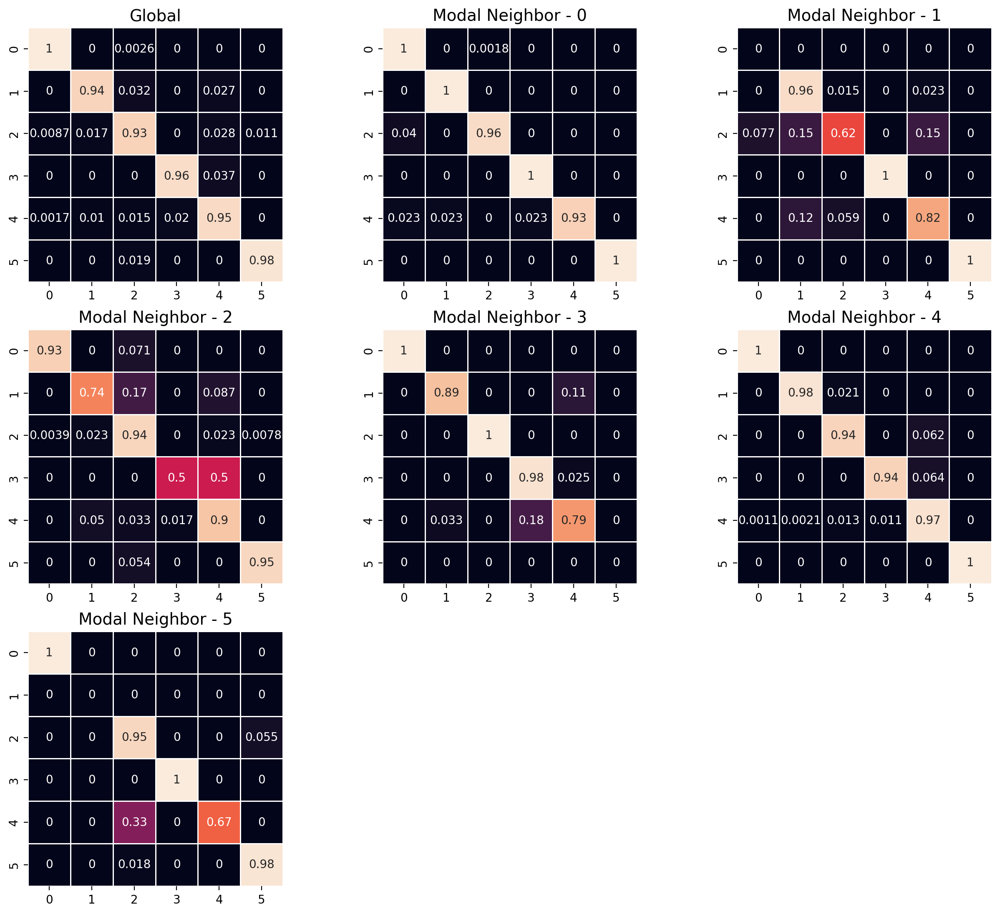

In [69]:
plot_transition_matrix(chicago_ward, cluster_col='ward')

And we can use those transition rates to make predictions about future conditions

In [70]:
future = chi_model.predict_markov_labels(time_steps=10, increment=1)

/Users/knaaptime/Dropbox/projects/geosnap/geosnap/analyze/_model_results.py:777: UserWarning: No base_year provided. Using the last period for which labels are known:  2016 
  warn(
/Users/knaaptime/Dropbox/projects/geosnap/geosnap/analyze/dynamics.py:123: FutureWarning: `use_index` defaults to False but will default to True in future. Set True/False directly to control this behavior and silence this warning
  w = Ws[w_type].from_dataframe(gpd.GeoDataFrame(gdf_wide), **w_options)
/Users/knaaptime/Dropbox/projects/geosnap/geosnap/analyze/dynamics.py:330: FutureWarning: `use_index` defaults to False but will default to True in future. Set True/False directly to control this behavior and silence this warning
  w = Ws[w_type].from_dataframe(gdf, **w_options)
/Users/knaaptime/Dropbox/projects/geosnap/geosnap/analyze/dynamics.py:392: UserWarning: Falling back to aspatial transition rule for unit 17031811401
  warn(
/Users/knaaptime/Dropbox/projects/geosnap/geosnap/analyze/dynamics.py:392: Us

In [71]:
animate_timeseries(future, 'predicted', categorical=True, filename='chicago_predictions.gif', fps=1.5)

<Figure size 2000x2000 with 0 Axes>

<Figure size 2000x2000 with 0 Axes>

<Figure size 2000x2000 with 0 Axes>

<Figure size 2000x2000 with 0 Axes>

<Figure size 2000x2000 with 0 Axes>

<Figure size 2000x2000 with 0 Axes>

<Figure size 2000x2000 with 0 Axes>

<Figure size 2000x2000 with 0 Axes>

<Figure size 2000x2000 with 0 Axes>

<Figure size 2000x2000 with 0 Axes>

<Figure size 2000x2000 with 0 Axes>

<Figure size 1000x1000 with 0 Axes>

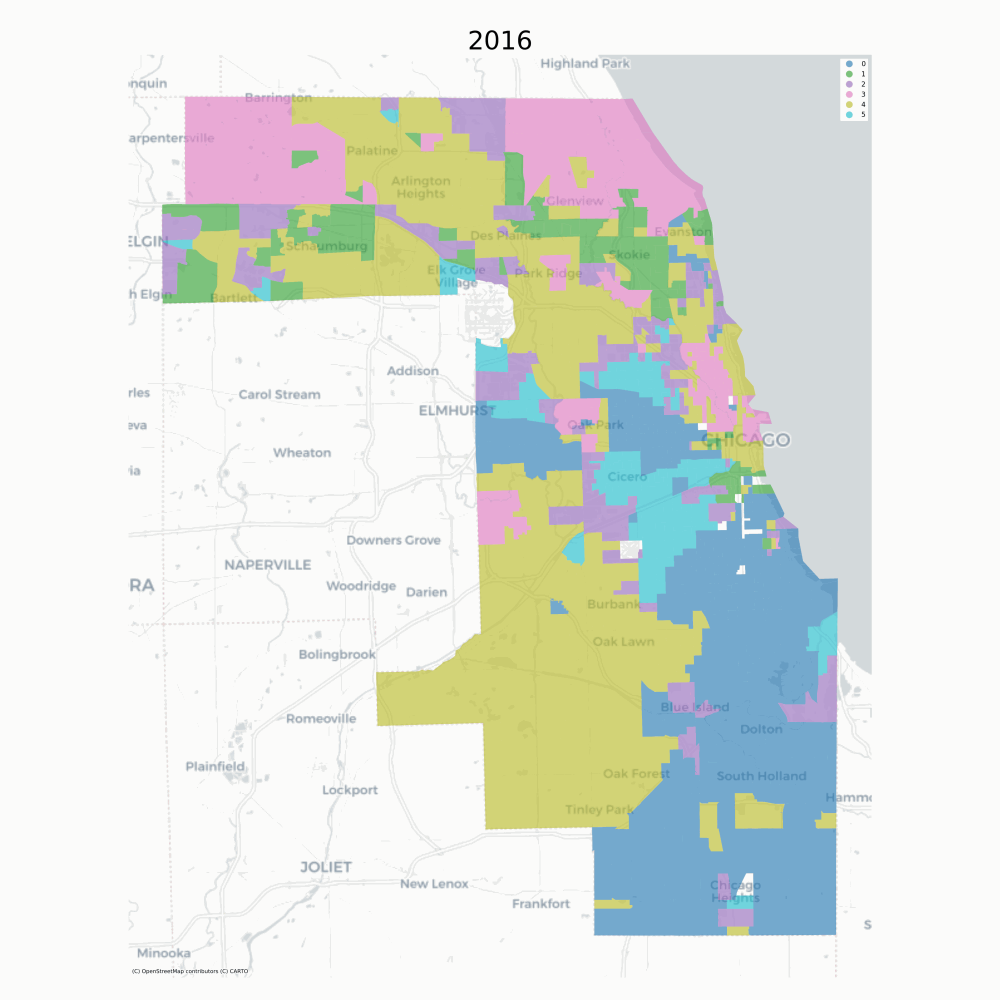

In [72]:
Image('chicago_predictions.gif', width=800)

From a social equity perspective, these predictions can help inform investments in place that are likely to provide the greatest return, such as providing place-based affordable houising in high-opportunity (but low likelihood of change) or by providing displacement protections in places that show large potential for change